In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('train.csv')
df

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


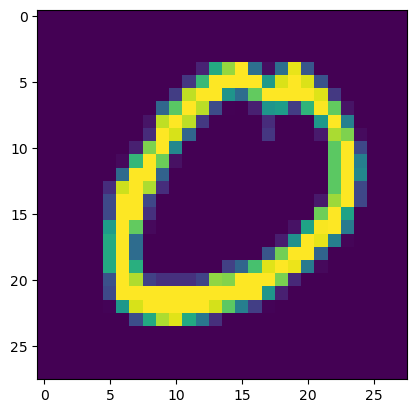

In [4]:
plt.imshow(df.iloc[13051, 1:].values.reshape(28,28))

In [5]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [6]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [11]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [12]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [14]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [7]:
from sklearn.neighbors import KNeighborsClassifier

In [8]:
knn = KNeighborsClassifier()

In [15]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [16]:
y_pred = knn.predict(X_test_trf)

In [18]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.950595238095238

In [19]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

0.2586904761904762
0.32392857142857145
0.51
0.6658333333333334
0.7378571428571429
0.8235714285714286
0.8432142857142857
0.8727380952380952
0.8867857142857143
0.9057142857142857
0.911547619047619
0.9180952380952381
0.9280952380952381
0.9341666666666667
0.9376190476190476
0.9382142857142857
0.9391666666666667
0.9408333333333333
0.9422619047619047
0.9435714285714286
0.9435714285714286
0.9441666666666667
0.9442857142857143
0.9461904761904761
0.9478571428571428
0.9489285714285715
0.9470238095238095
0.9486904761904762
0.9503571428571429
0.95
0.9510714285714286
0.9515476190476191
0.950952380952381
0.9525
0.9511904761904761
0.9523809523809523
0.9521428571428572
0.9525
0.9525
0.9528571428571428
0.9520238095238095
0.9526190476190476
0.9527380952380953
0.9539285714285715
0.9530952380952381
0.9528571428571428
0.9538095238095238
0.9538095238095238
0.9536904761904762
0.9541666666666667
0.9539285714285715
0.954047619047619
0.9530952380952381
0.9535714285714286
0.9542857142857143
0.9545238095238096
0.

KeyboardInterrupt: 

In [20]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [21]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [22]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [23]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [24]:
pca.explained_variance_
# Eigen values

array([40.67111197, 29.17023391, 26.74459392])

In [25]:
pca.components_.shape
# Eigen vectors

(3, 784)